In [2]:
from utils.utils import load_config, get_conf, create_datasets
import torch
import numpy as np
import networkx as nx

import networkx as nx
import torch
import torch_geometric
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

In [3]:
def animation(graphs, h=10, w=7, vmin=-15, vmax=15, steps=30):
    fig, ax = plt.subplots(figsize=(8, 6))
    
    sm = ScalarMappable(cmap=plt.cm.plasma, norm=Normalize(vmin=vmin, vmax=vmax))
    sm.set_array([])  # Required for ScalarMappable to work
    
    G = torch_geometric.utils.to_networkx(graphs[0], to_undirected=True)
    pos = nx.circular_layout(G)
    # pos = [(n%w, n ) for n in range(G.number_of_nodes())]
    plt.colorbar(sm, ax=ax)  # Associate colorbar with the graph's axis
    
    def visualize_graphs(frame):
        # ax.clear()
        graph = graphs[frame]
        # Convert the graph to a NetworkX graph
        G = torch_geometric.utils.to_networkx(graph, to_undirected=True)
        
        # Get node colors based on graph.x values
        node_colors = np.array([graph.x[node][0] for node in range(G.number_of_nodes())])
        
        # Draw the graph with node colors
        nx.draw(G, pos, node_color=node_colors, with_labels=False, cmap=plt.cm.plasma, node_size=200, 
                font_color='black', vmin=vmin, vmax=vmax, ax=ax)
        
        # plt.show()
    anim = FuncAnimation(fig, visualize_graphs, np.arange(0, len(graphs), steps), interval = 1000/30)
    return anim

In [4]:
config_path = './configs/config_kuramoto.yml'
config = load_config(config_path)

root = config["root"]
# name = config["name"]
name = 'kuramoto-0-1'
epsilon = config["step_size"]

rng = np.random.default_rng(seed=config.get("seed", 42))
conf = get_conf(config, None, rng)

# G = nx.grid_2d_graph(7, 10)
G = nx.complete_graph(10)
# G = nx.erdos_renyi_graph(30, 0.2)

train_dataset, valid_dataset, test_dataset = create_datasets(conf, root=root, name=name, graph=G)

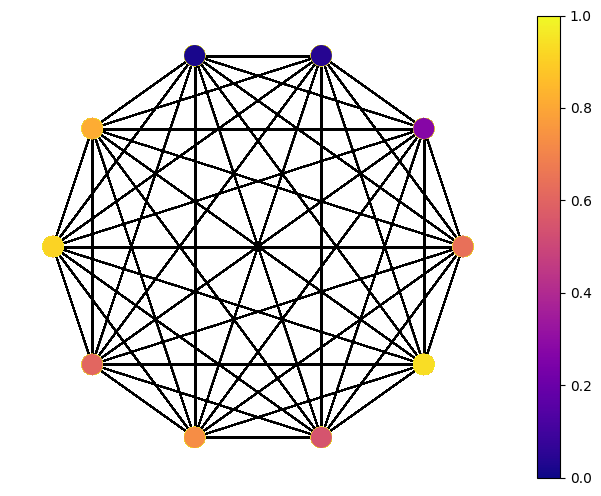

In [4]:
anim = animation(train_dataset, steps=8, vmin=0, vmax=1)
html_anim = anim.to_jshtml()
HTML(html_anim)

In [5]:
train_dataset[998].x

tensor([[1.0495],
        [1.0495],
        [1.0495],
        [1.0495],
        [1.0495],
        [1.0495],
        [1.0495],
        [1.0495],
        [1.0495],
        [1.0495]])

In [6]:
name = 'kuramoto-0-2pi'
config['R'] = 10.
config['w'] = 2.
config['input_range'] = [0, 2*np.pi]
conf = get_conf(config, None, rng)

In [7]:
train_dataset_2, _, _ = create_datasets(conf, root=root, name=name, graph=G)

Processing...
100%|██████████| 999/999 [00:00<00:00, 83405.19it/s]
Done!
Processing...
100%|██████████| 499/499 [00:00<00:00, 70033.72it/s]
Done!
Processing...
100%|██████████| 499/499 [00:00<00:00, 34431.01it/s]
Done!


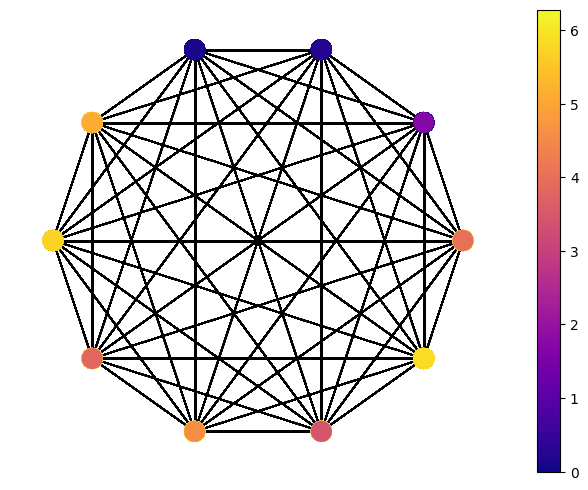

In [8]:
anim = animation(train_dataset_2, steps=8, vmin=0, vmax=2*np.pi)
html_anim = anim.to_jshtml()
HTML(html_anim)

In [9]:
train_dataset_2[998].x

tensor([[ 5.8426],
        [-0.4389],
        [-0.4402],
        [-0.4402],
        [ 5.8428],
        [ 5.8429],
        [ 5.8426],
        [ 5.8427],
        [ 5.8425],
        [ 5.8429]])